# EXPLORATORY ANALYSIS OF TERRORISM IN NIGERIA AND A MACHINE LEARNING APPROACH TO THE PREDICTION OF THE SUCCESS OF AN ATTACK

**Author:** [Igemhokhai Shedrach](https://www.linkedin.com/igemhokhai-shedrach-60982819a)

Terrorism, in its broadest sense, is the use of Violence and fear to achieve an ideological aim. The term is used in this regard primary to refer to intentional violence during peacetime, or in the content of war against non-combatant(mostly civilians and neutral military personnel). A common definition of terrorim is the systematic or threatened of violence to intimidate a population or government for political, religious, or ideological goals.

**Goals of this Project :**
- To conduct Exploratory data Analysis, supported by appropriate viusals, to find out the hot zones of terrorim in Nigeria.
- To develop a good performing model, in order to predict if a potential terrorist attack would be successful or not.
- Build a dash app to allow users interact with the outcome of this projects.

**Source of Data :**
For this project, the [Global Terrorism Database(GTD)]("www.start.umd.edu/gtd/"), a database of terrorist incidents from 1970 up to 2020(Although some years were excluded), was used. The dataset can be downloaded in preferred format from www.start.umd.edu/gtd/

##### IMPORTING LIBRARIES

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

#### LOAD EXCEL DATA INTO A PANDAS DATAFRAME

In [3]:
df=pd.read_excel(r"C:\Users\User\Desktop\Machine Learning Project\globalterrorismdb_0522dist.xlsx")
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaT,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaT,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaT,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaT,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaT,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


## EXPLORATORY DATA ANALYSIS

In [4]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

#### RENAME COLUMNS FOR BETTER READABILITY

In [5]:
df.rename(columns={'iyear':'Year','imonth':'Month','iday':'Day','country_txt':'Country','provstate':'state',
                       'region_txt':'Region','attacktype1_txt':'AttackType','target1':'Target','nkill':'Killed',
                       'nwound':'Wounded','summary':'Summary','gname':'Group','targtype1_txt':'Target_type',
                       'weaptype1_txt':'Weapon_type','motive':'Motive'},inplace=True)

In [6]:
df.head()

,eventid,Year,Month,Day,approxdate,extended,resolution,country,Country,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaT,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaT,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaT,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaT,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaT,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


##### SUBSET DATA INTO SPECIFIC COLUMNS, AND DROP UNWANTED COLUMNS

In [7]:
df=df[['Year','Month','Day','Country','state','Region','city','latitude','longitude','AttackType','Killed',
               'Wounded','suicide','Target','Summary','Group','Target_type','Weapon_type','Motive',"success"]]

In [8]:
df.head()

,Year,Month,Day,Country,state,Region,city,latitude,longitude,AttackType,Killed,Wounded,suicide,Target,Summary,Group,Target_type,Weapon_type,Motive,success
0,1970,7,2,Dominican Republic,National,Central America & Caribbean,Santo Domingo,18.456792,-69.951164,Assassination,1.0,0.0,0,Julio Guzman,NaN,MANO-D,Private Citizens & Property,Unknown,NaN,1
1,1970,0,0,Mexico,Federal,North America,Mexico city,19.371887,-99.086624,Hostage Taking (Kidnapping),0.0,0.0,0,"Nadine Chaval, daughter",NaN,23rd of September Communist League,Government (Diplomatic),Unknown,NaN,1
2,1970,1,0,Philippines,Tarlac,Southeast Asia,Unknown,15.478598,120.599741,Assassination,1.0,0.0,0,Employee,NaN,Unknown,Journalists & Media,Unknown,NaN,1
3,1970,1,0,Greece,Attica,Western Europe,Athens,37.997490,23.762728,Bombing/Explosion,NaN,NaN,0,U.S. Embassy,NaN,Unknown,Government (Diplomatic),Explosives,NaN,1
4,1970,1,0,Japan,Fukouka,East Asia,Fukouka,33.580412,130.396361,Facility/Infrastructure Attack,NaN,NaN,0,U.S. Consulate,NaN,Unknown,Government (Diplomatic),Incendiary,NaN,1


- Since the goal of this project is to explore and analyse _Terrorism in Nigeria_ , we would further subset our data to display information relating to NIGERIA only.

In [9]:
df_nigeria=df[df["Country"]=="Nigeria"]
df_nigeria.head(10)

,Year,Month,Day,Country,state,Region,city,latitude,longitude,AttackType,Killed,Wounded,suicide,Target,Summary,Group,Target_type,Weapon_type,Motive,success
3593,1976,2,13,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.452331,3.419044,Assassination,3.0,1.0,0,4th Head of State: General Murtala Ramat Mohammed,02/13/1976: Assailants attacked General Murtal...,Coup plotters,Government (General),Firearms,NaN,1
10025,1980,1,17,Nigeria,Kaduna,Sub-Saharan Africa,Kaduna,10.530204,7.437338,Unknown,NaN,NaN,0,Consulate,NaN,Zimbabwe Patriotic Front,Government (Diplomatic),Unknown,NaN,1
20219,1983,11,11,Nigeria,Unknown,Sub-Saharan Africa,Unknown,NaN,NaN,Assassination,0.0,1.0,0,"Senator Girgiri Lawan, Senator of ruling Natio...",NaN,Unknown,Government (General),Unknown,NaN,0
20347,1983,11,27,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.618911,3.305532,Assassination,1.0,0.0,0,"Chief Joe Nkpang, Assistant general Manager",NaN,Gang,Government (General),Unknown,NaN,1
20359,1983,11,29,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.455641,3.429865,Assassination,0.0,1.0,0,"Chief Edwin Ume-Ezeoke, former speaker",NaN,Unknown,Government (General),Firearms,NaN,0
33216,1988,1,23,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.618911,3.305532,Assassination,1.0,0.0,0,Charge Aboubaker,NaN,Unknown,Government (Diplomatic),Firearms,NaN,1
33773,1988,3,13,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.618911,3.305532,Assassination,3.0,0.0,0,Teachers,NaN,Unknown,Educational Institution,Firearms,NaN,1
45918,1991,3,28,Nigeria,Katsina,Sub-Saharan Africa,Unknown,12.323997,7.520477,Facility/Infrastructure Attack,0.0,0.0,0,office,NaN,Katsina Muslim Society,Journalists & Media,Incendiary,NaN,1
47907,1991,8,30,Nigeria,Zamfara,Sub-Saharan Africa,Gusau City,12.169841,6.674302,Facility/Infrastructure Attack,2.0,0.0,0,"Courthouse, Bank, Guest house",NaN,Unknown,Government (General),Incendiary,NaN,1
48543,1991,10,14,Nigeria,Kano,Sub-Saharan Africa,Kano,11.974328,8.500260,Facility/Infrastructure Attack,8.0,34.0,0,Sabron Gari Area,NaN,Muslim Militants,Private Citizens & Property,Firearms,NaN,1


In [10]:
df_nigeria.shape

(5550, 20)

In [11]:
df_nigeria.info();

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5550 entries, 3593 to 209664
Data columns (total 20 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Year         5550 non-null   int64  
 1   Month        5550 non-null   int64  
 2   Day          5550 non-null   int64  
 3   Country      5550 non-null   object 
 4   state        5550 non-null   object 
 5   Region       5550 non-null   object 
 6   city         5550 non-null   object 
 7   latitude     5503 non-null   float64
 8   longitude    5503 non-null   float64
 9   AttackType   5550 non-null   object 
 10  Killed       5059 non-null   float64
 11  Wounded      4027 non-null   float64
 12  suicide      5550 non-null   int64  
 13  Target       5545 non-null   object 
 14  Summary      5490 non-null   object 
 15  Group        5550 non-null   object 
 16  Target_type  5550 non-null   object 
 17  Weapon_type  5550 non-null   object 
 18  Motive       1181 non-null   object 
 19  s

- Check for duplicates and drop duplicated data

In [12]:
df_nigeria.duplicated().sum()

90

In [13]:
df_nigeria=df_nigeria.drop_duplicates(keep=False)

#### Confirm if all duplicated data has been dropped

In [14]:
df_nigeria.duplicated().sum()

0

### Finding missing Values

In [15]:
df_nigeria.isnull().sum()

Year              0
Month             0
Day               0
Country           0
state             0
Region            0
city              0
latitude         47
longitude        47
AttackType        0
Killed          485
Wounded        1479
suicide           0
Target            1
Summary          56
Group             0
Target_type       0
Weapon_type       0
Motive         4270
success           0
dtype: int64

#### As we see, there are missing values in columns _"Killed" "Wounded"_ , we would not remove those rows with mising values in both columns, but rather,substitute those values with a average data so the missing values would not affect to our training data.

In [16]:
df_nigeria['Killed'].fillna((df['Killed'].mean()), inplace=True)
df_nigeria['Wounded'].fillna((df['Wounded'].mean()), inplace=True)

#### Lets check for Outliers in key columns, "Killed" and "Wounded

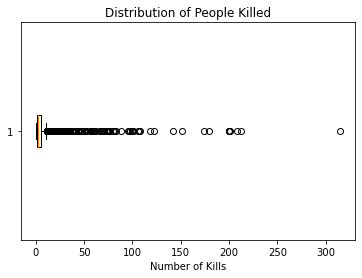

In [17]:
plt.boxplot(df_nigeria["Killed"], vert=False)
plt.xlabel("Number of Kills")
plt.title("Distribution of People Killed");

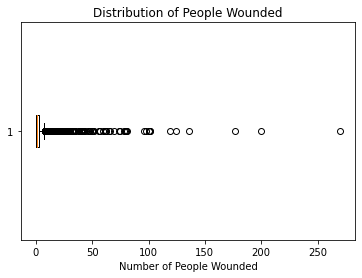

In [18]:
plt.boxplot(df_nigeria["Wounded"], vert=False)
plt.xlabel("Number of People Wounded")
plt.title("Distribution of People Wounded");

In [19]:
df_nigeria[['Killed', 'Wounded']].describe()

,Killed,Wounded
count,5425.000000,5425.000000
mean,5.519272,3.157052
std,13.665266,9.326925
min,0.000000,0.000000
25%,1.000000,0.000000
50%,2.000000,1.000000
75%,5.000000,3.085872
max,315.000000,270.000000


#### Lets start by Visualising the Number of terrorist attacks in each year from 1976 to 2020

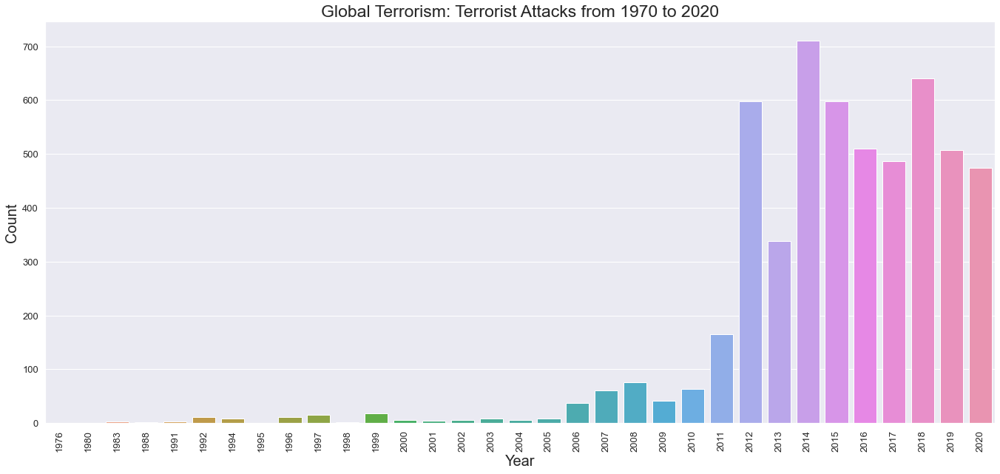

In [582]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(23, 10))
sns.countplot('Year', data=df_nigeria)
plt.title('Global Terrorism: Terrorist Attacks from 1970 to 2020', fontsize=23)
plt.xticks(rotation=90, fontsize=13)
plt.yticks(fontsize=13)
plt.xlabel('Year', fontsize=20) 
plt.ylabel('Count', fontsize=20);

##### From the above plot, the following information are pointed out :
- Majority of terrorist attacks in Nigeria occured from 2011 to 2020.
- Terrorism in Nigeria peaked at 2014.
- Despite Lockdown in 2020, due to COVID, there was still a very significant acccount of Terrorism in Nigeria.

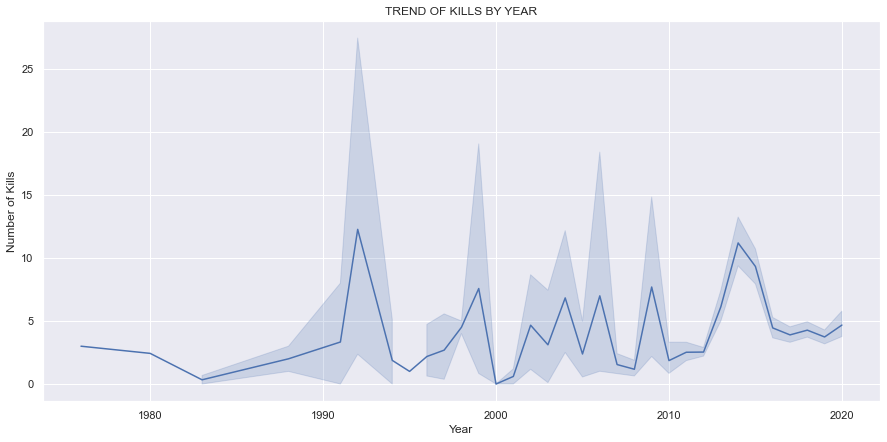

In [21]:
plt.figure(figsize=(15,7))
sns.lineplot(x=df_nigeria["Year"], y=df_nigeria["Killed"])
plt.xlabel("Year")
plt.ylabel("Number of Kills")
plt.title("TREND OF KILLS BY YEAR")
plt.show()

#### Next, we would take a look at the most Terrorised states in Nigeria.

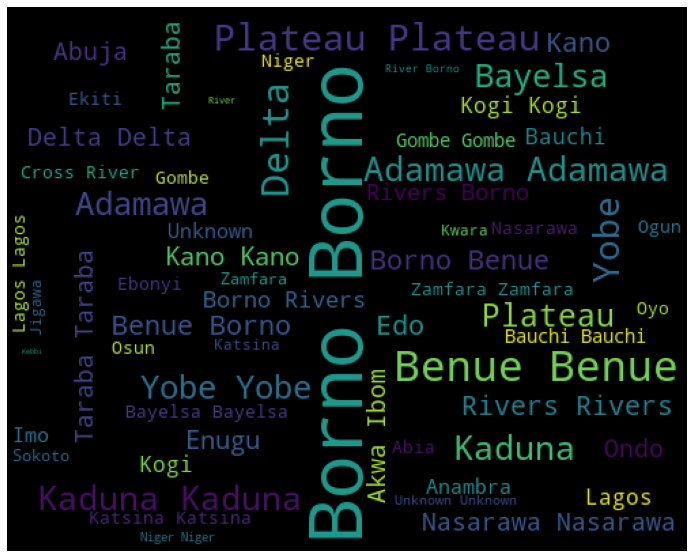

In [22]:
from wordcloud import WordCloud
from scipy import signal
cities = df_nigeria.state.dropna(False)
plt.subplots(figsize=(20,10))
wordcloud = WordCloud(background_color = 'black',
                     width = 500,
                     height = 400).generate(' '.join(cities))
plt.axis('off')
plt.imshow(wordcloud)
plt.show()

#### From the Above WordCloud, the larger the name of the state, the higher the terrorism. Hence, _Borno State_ in Northern Nigeria appears to be the most Terrorized State in Nigeria over the years

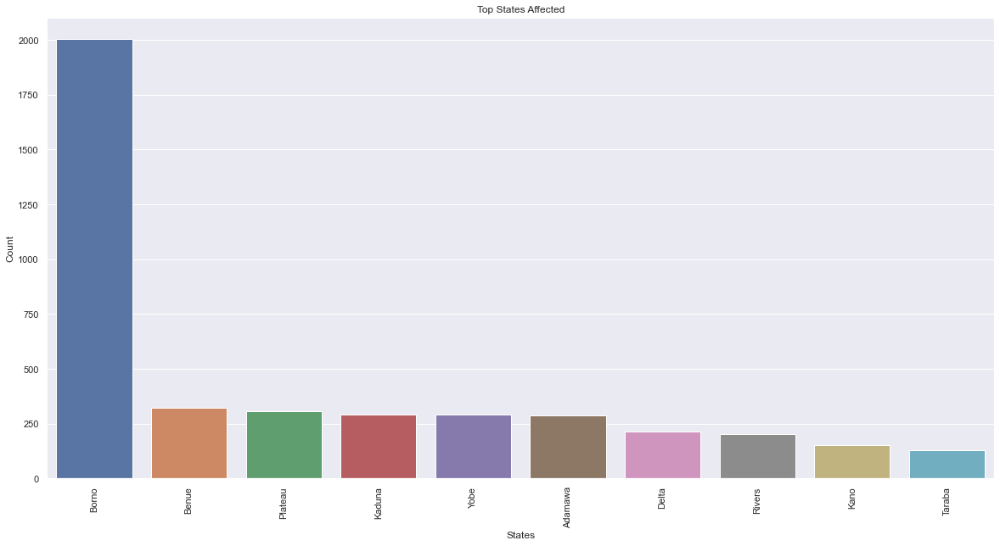

In [23]:
plt.subplots(figsize=(20,10))
sns.barplot(df_nigeria['state'].value_counts()[:10].index,df_nigeria['state'].value_counts()[:10].values)
plt.title('Top States Affected')
plt.xlabel('States')
plt.ylabel('Count')
plt.xticks(rotation= 90)
plt.show()

#### The Barplot Above proves the initial point up above. It also shows that Borno is so greatly terrorised that it faced about 630% the terrorism faced by the second most terrorised state in nigeria, "Benue".

#### Next, we would categorize the states in our data(36 plus the federal capital terroritoy, _Abuja_) to further get an insight into our analysis.
#### _The code below executes the categorization_

In [519]:
df_nigeria1=df_nigeria.copy()
def func(x) : 
    if x in ["Benue","Kogi","Kwara","Nasarawa","Niger","Plateau","Abuja"] :
        return "North Central"
    elif x in ["Adamawa","Bauchi","Borno","Gombe","Taraba","Yobe"] :
        return "North East"
    elif x in ["Jigawa","Kaduna","Kano","Katsina","Kebbi","Sokoto","Zamfara"] :
        return "North West"
    elif x  in ["Abia","Anambra","Ebonyi","Enugu","Imo"] :
        return "South East"
    elif x in ["Akwa Ibom", "Bayelsa","Cross River","Delta","Edo","Rivers"] :
        return "South South"
    elif x in ["Ekiti","Lagos","Ogun","Ondo","Osun","Oyo"] :
        return "South West"
    else :
        return "Unkwown"
df_nigeria1["zone"] = df_nigeria1["state"].apply(func)
df_nigeria1.head()

,Year,Month,Day,Country,state,Region,city,latitude,longitude,AttackType,...,Wounded,suicide,Target,Summary,Group,Target_type,Weapon_type,Motive,success,zone
3593,1976,2,13,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.452331,3.419044,Assassination,...,1.000000,0,4th Head of State: General Murtala Ramat Mohammed,02/13/1976: Assailants attacked General Murtal...,Coup plotters,Government (General),Firearms,NaN,1,South West
10025,1980,1,17,Nigeria,Kaduna,Sub-Saharan Africa,Kaduna,10.530204,7.437338,Unknown,...,3.085872,0,Consulate,NaN,Zimbabwe Patriotic Front,Government (Diplomatic),Unknown,NaN,1,North West
20219,1983,11,11,Nigeria,Unknown,Sub-Saharan Africa,Unknown,NaN,NaN,Assassination,...,1.000000,0,"Senator Girgiri Lawan, Senator of ruling Natio...",NaN,Unknown,Government (General),Unknown,NaN,0,Unkwown
20347,1983,11,27,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.618911,3.305532,Assassination,...,0.000000,0,"Chief Joe Nkpang, Assistant general Manager",NaN,Gang,Government (General),Unknown,NaN,1,South West
20359,1983,11,29,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.455641,3.429865,Assassination,...,1.000000,0,"Chief Edwin Ume-Ezeoke, former speaker",NaN,Unknown,Government (General),Firearms,NaN,0,South West


In [738]:
df_nigeria1["zone"].unique()

array(['South West', 'North West', 'Unkwown', 'South South', 'North East',
       'North Central', 'South East'], dtype=object)

#### As seen above, we now have a new column into our dataframe consisting of unique objects of the six geopololitical zones in Nigeria grouped by states. we would now create a pie chart to further show us, the most terrorized geoplotical zones in Nigeria across the years.

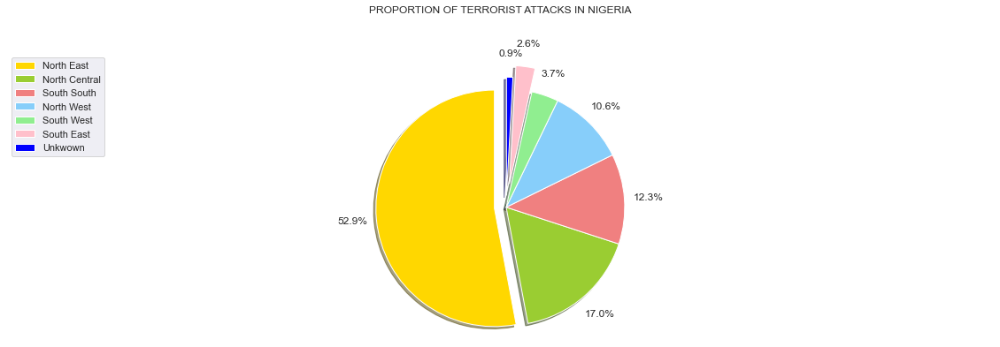

In [560]:
labels=df_nigeria1["zone"].value_counts().index
propor=df_nigeria1["zone"].value_counts().values
colors=['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink', "blue"]
explode = [0.1, 0, 0 ,0 , 0, 0.2, 0.1]
plt.figure(figsize=(20, 6))
plt.pie(propor, labels=None, colors=colors,explode=explode,
        autopct='%1.1f%%',pctdistance=1.2, startangle=90,shadow=True)
plt.title("PROPORTION OF TERRORIST ATTACKS IN NIGERIA", y=1.12)
plt.axis("equal")
plt.legend(labels=labels, loc='upper left') 
plt.show()

##### The Pie Chart above shows that :
- North Eastern Nigeria consisting of _"Adamawa","Bauchi","Borno","Gombe","Taraba",and "Yobe"_ state, has been the most terriorized zone in NIgeria constituting as much as about 53% of the Terrorism faced in Nigeria from 1976 - 2019.
- South South zone, which includes _"Akwa Ibom", "Bayelsa","Cross River","Delta","Edo", and "Rivers"_ state is the most terrorzized southern Region in Nigeria.
##### Next, let us take a look at the proportion of deaths in Nigeria as a result of terrorism according to the geopolitical zones

In [562]:
killData = df_nigeria1.loc[:,'Killed']

In [567]:
zone = df_nigeria1.loc[:,'zone']
zoneKillData = pd.concat([zone,killData], axis=1)
zoneKillData["Killed"]=zoneKillData["Killed"].astype(int)
pivot_kill_by_zone = zoneKillData.pivot_table(columns='zone', values='Killed', aggfunc='sum')
pivot_kill_by_state=pivot_kill_by_zone.T.sort_values(by="Killed",ascending=False)
pivot_kill_by_state

,Killed
zone,
North East,20815
North Central,4245
North West,3120
South South,919
South West,488
South East,107
Unkwown,39


In [588]:
total_deaths=pivot_kill_by_state["Killed"].sum()
print("Total Deaths as a result of terrorism in Nigeria is" , total_deaths)

Total Deaths as a result of terrorism in Nigeria is 29733


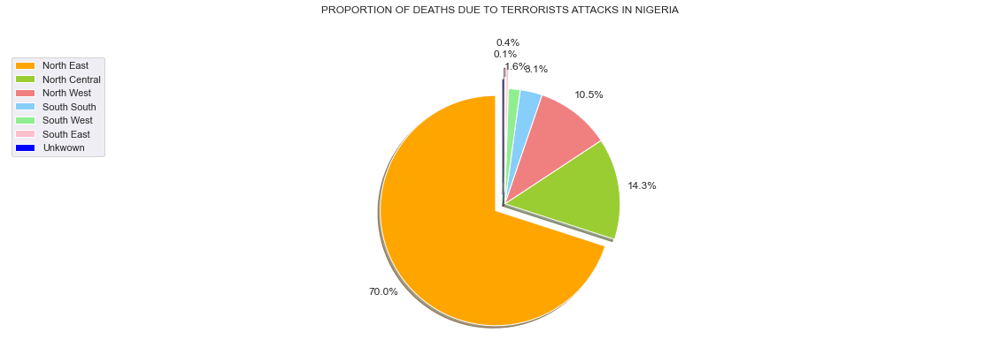

In [572]:
labels=pivot_kill_by_state.index
propor=pivot_kill_by_state["Killed"]
colors=['orange', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink', "blue"]
explode = [0.1, 0, 0 ,0 , 0, 0.2, 0.1]
plt.figure(figsize=(20, 6))
plt.pie(propor, labels=None, colors=colors,explode=explode,
        autopct='%1.1f%%',pctdistance=1.2, startangle=90,shadow=True)
plt.title("PROPORTION OF DEATHS DUE TO TERRORISTS ATTACKS IN NIGERIA", y=1.12)
plt.axis("equal")
plt.legend(labels=labels, loc='upper left') 
plt.show()

###### The following information can be gotten from the pie chart above :
- North East(The Most Terrorized zone in Nigeria) experienced the most number of deaths, accounting for as large as 70% of the total number of deaths across all geopolitical zones over the years.
- South South(The Most Terrorized southern zone in Nigeria) faced the most number of deaths in Southern Nigeria accounting for 8.1% of total deaths in Nigeria, and about 80% of total deaths in southern Nigeria.

#### What are the top 10 States with the most Deaths due to Terrorim?

In [573]:
state = df_nigeria.loc[:,'state']
TypeKillData = pd.concat([state,killData], axis=1)
TypeKillData["Killed"]=TypeKillData["Killed"].astype(int)

In [476]:
pivot_kill_by_state = TypeKillData.pivot_table(columns='state', values='Killed', aggfunc='sum')
pivot_kill_by_state=pivot_kill_by_state.T.sort_values(by="Killed",ascending=False)
pivot_kill_by_state.head(10)

,Killed
state,
Borno,15756
Yobe,1898
Adamawa,1867
Benue,1641
Plateau,1553
Kaduna,1456
Taraba,815
Zamfara,770
Kano,648


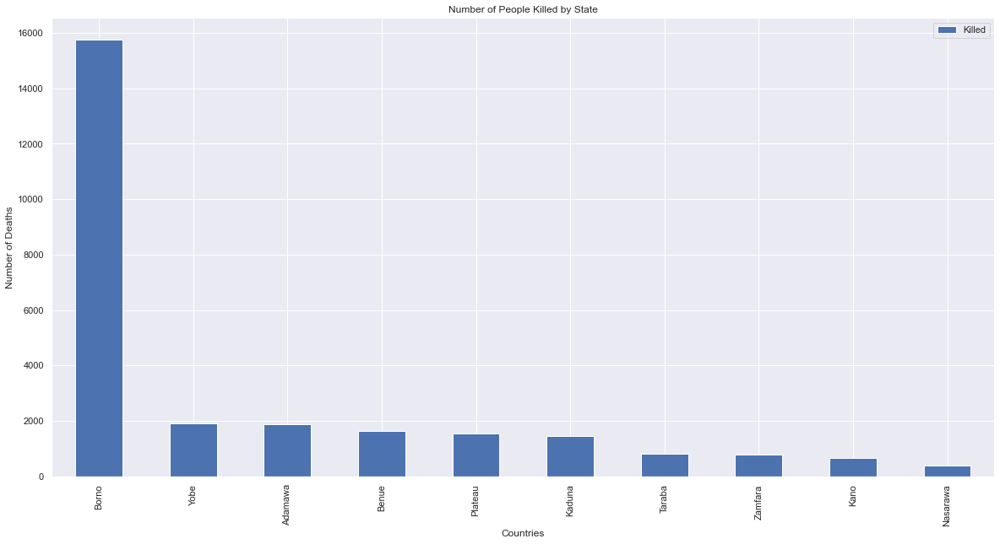

In [477]:
pivot_kill_by_state[0:10].plot(kind="bar",
                       xlabel="Countries",
                       ylabel="Number of Deaths",
                       title="Number of People Killed by State",
                       figsize=(20,10)
);

##### The Bar Chart above shows thats :
- Borno(Most Terrorized state), accounted for the most deaths, by a very large proportion.
- The top 10 states with the highest number of deaths, are all from Northern Nigeria.
- Number of Deaths have have a significant positive Linear relationship with The Number of Attacks

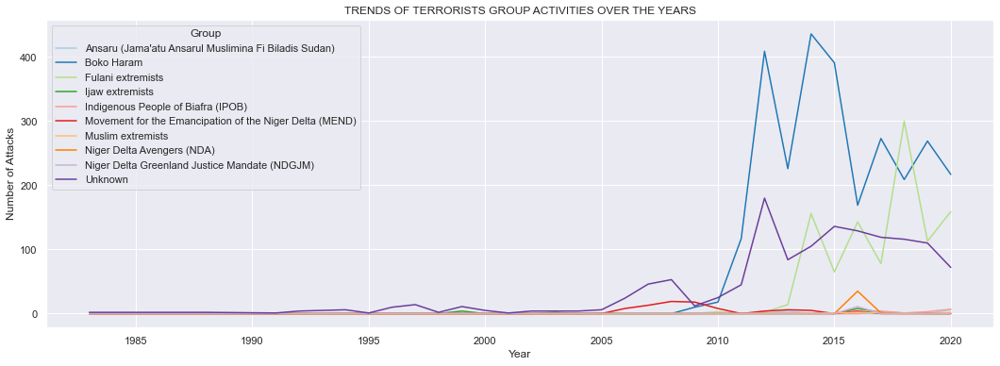

In [39]:
top_10groups=df_nigeria[df_nigeria["Group"].isin(df_nigeria["Group"].value_counts()[:10].index)]
pd.crosstab(top_10groups.Year,top_10groups.Group).plot(color=sns.color_palette("Paired",10))
fig=plt.gcf()
fig.set_size_inches(18,6)
plt.title("TRENDS OF TERRORISTS GROUP ACTIVITIES OVER THE YEARS")
plt.ylabel("Number of Attacks")
plt.show()

In [590]:
top_10groups=df_nigeria["Group"].value_counts().sort_values(ascending=False)
top_10groups[:10]

Boko Haram                                                 2744
Unknown                                                    1333
Fulani extremists                                          1034
Movement for the Emancipation of the Niger Delta (MEND)      85
Niger Delta Avengers (NDA)                                   36
Ijaw extremists                                              18
Indigenous People of Biafra (IPOB)                           15
Ansaru (Jama'atu Ansarul Muslimina Fi Biladis Sudan)         12
Niger Delta Greenland Justice Mandate (NDGJM)                11
Muslim extremists                                            10
Name: Group, dtype: int64

In [605]:
df_group_data = df_nigeria.groupby(['Group']).agg(Total_attacks=('Killed', 'count'),Total_killed=('Killed', 'sum'),Total_wound=('Wounded', 'sum')).sort_values(by="Total_attacks", ascending=False).reset_index()
df_group_data[["Total_killed","Total_wound"]]=df_group_data[["Total_killed","Total_wound"]].astype(int)
df_group_data.head(10)


,Group,Total_attacks,Total_killed,Total_wound
0,Boko Haram,2744,21218,11903
1,Unknown,1333,2787,2253
2,Fulani extremists,1034,4981,2426
3,Movement for the Emancipation of the Niger Del...,85,291,119
4,Niger Delta Avengers (NDA),36,6,5
5,Ijaw extremists,18,61,28
6,Indigenous People of Biafra (IPOB),15,16,18
7,Ansaru (Jama'atu Ansarul Muslimina Fi Biladis ...,12,56,13
8,Niger Delta Greenland Justice Mandate (NDGJM),11,0,0
9,Muslim extremists,10,41,18


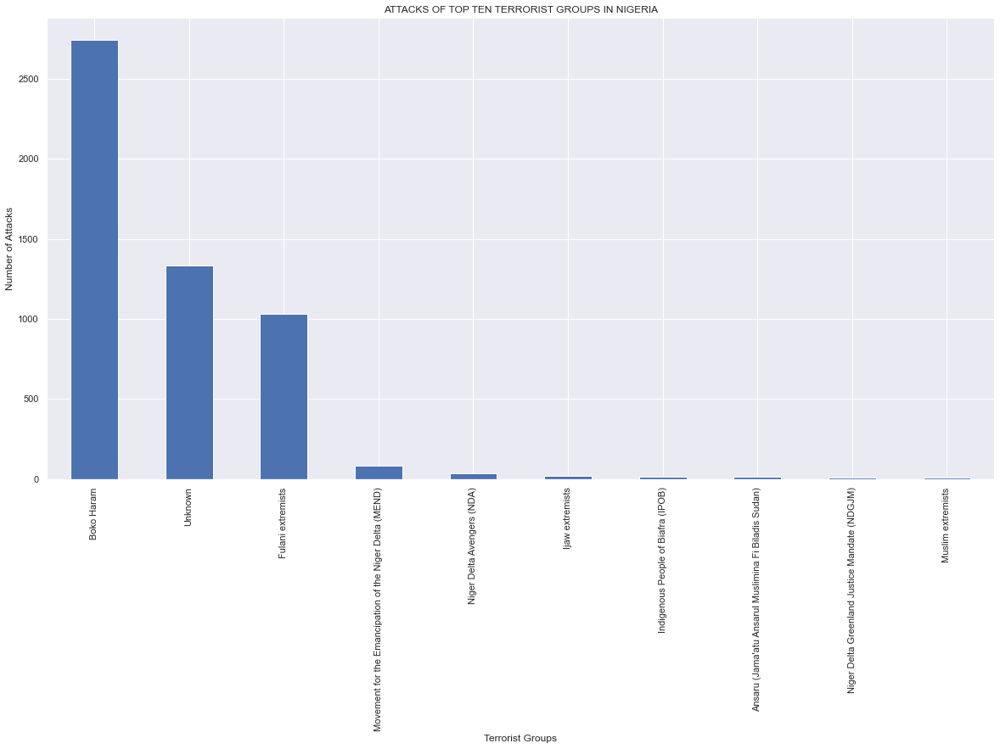

In [595]:
plt.figure(figsize=(20,10))
top_10groups[:10].plot(kind="bar")
plt.xlabel("Terrorist Groups")
plt.ylabel("Number of Attacks")
plt.title("ATTACKS OF TOP TEN TERRORIST GROUPS IN NIGERIA")
plt.show()

#### The dataframe and barplot above highlights the following information :
- Bokoharam and Fulani Extremist are by large, the group with the most terrorism both accounting for the highest attacks and deaths in order.
- These groups are largely responsible for the high amount of terrorism in Northern Nigeria

### Next, We Would Represent some of the maps above in a geological map using folium and plotly,so as to see a geological distribution of the number of attacks, as well as Deaths.

In [45]:
import folium
from folium import plugins
from folium.plugins import MarkerCluster

In [46]:
latitude=df_nigeria["latitude"].to_list()
longitude=df_nigeria["longitude"].to_list()

In [47]:
for x in latitude:
    latitud = x

In [48]:
for y in longitude:
    longitud = y

In [90]:
map = folium.Map(location = [latitud, longitud], zoom_start=6.2) 
markerCluster = folium.plugins.MarkerCluster().add_to(map)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = plugins.MarkerCluster().add_to(map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df_nigeria.latitude.dropna(), df_nigeria.longitude.dropna(), df_nigeria.AttackType):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
map

In [624]:
nigeria_geo=pd.DataFrame({"state":df_nigeria["state"].value_counts().index,"Number-of-attacks":df_nigeria["state"].value_counts().values})
nigeria_geo.head(10)

,state,Number-of-attacks
0,Borno,2002
1,Benue,321
2,Plateau,308
3,Kaduna,292
4,Yobe,289
5,Adamawa,287
6,Delta,212
7,Rivers,202
8,Kano,153
9,Taraba,130


In [805]:
import json
path=open(r"C:\Users\User\Desktop\Machine Learning Project\Boundary_states.json")
state_geo=json.load(path)

In [789]:
Attack_Map=folium.Map()

In [790]:
folium.Choropleth(geo_data =state_geo,
                  name="choropleth",
                  data=nigeria_geo,
                  columns=["state","Number-of-attacks"],
                  key_on="feature.properties.StateName",
                  color="Number-of-attacks",
                  fill_color="YlGnBu",
                  fill_opacity=1,
                  line_opacity=0.2,
                  legend_name="Attack Rate",
                  smooth_factor=0,
                  highlight=True,
                  line_color="#0000",
                  show=False,
                  Overlay=True,
                  nan_fill_color="White"
).add_to(Attack_Map)
Attack_Map

##### Up above, are two Maps.
- The First map displays the number of attacks in each state, while also displaying the loaction of the state in the Nigeria Map. It can also be seen that Borno has by far the highest count of terrorist attacks.
- The second map is a choropleth map, and it displays counts of terrorism by color intensity. The higher the color intensity, the more terrorized a state is. as seen, the states, aside Borno(displayed as blue), because their attack counts all fall in the same color range. Borno is this case might be conidered an outlier, but we won't be dropping it as it merely shows how terrorized Borno state was, over the years.

##### But, in order to get more insight into the map distribution, we would recreate the above choropleth map, but this time, Borno which happens to be an outlier will not be include. we start by dropping Borno from the data.

In [695]:
low_count_attack=nigeria_geo.copy()
low_count_attack=low_count_attack.drop(index=0, axis=0)
low_count_attack.head()

,state,Number-of-attacks
1,Benue,321
2,Plateau,308
3,Kaduna,292
4,Yobe,289
5,Adamawa,287


##### With Borno dropped, let's recreate the map

In [696]:
attack_map=folium.Map()
folium.Choropleth(geo_data =state_geo,
                  name="choropleth",
                  data=low_count_attack,
                  columns=["state","Number-of-attacks"],
                  key_on="feature.properties.StateName",
                  color="Number-of-attacks",
                  fill_color="YlGnBu",
                  fill_opacity=1,
                  line_opacity=0.2,
                  legend_name="Attack Rate",
                  smooth_factor=0,
                  highlight=True,
                  line_color="#0000",
                  show=False,
                  Overlay=True,
                  nan_fill_color="White"
).add_to(attack_map)
attack_map

###### The attack distribution on a Choropleth map now makes more sense. Borno is represented by white, a defaulted color for not been in our dataset. you can now the states with high or low count of terrorism by taking a look at the color and the range of number, it represents in the color scale.

### What were the type of attacks, and the Resuting casualties as a result of the attacks ?

In [50]:
df_attacktype_killed = df_nigeria.groupby(['AttackType']).agg(Total_attacks=('Killed', 'count'),Total_killed=('Killed', 'sum'),Total_wound=('Wounded', 'sum')).reset_index()
df_attacktype_killed[["Total_killed","Total_wound"]]=df_attacktype_killed[["Total_killed","Total_wound"]].astype(int)
df_attacktype_killed

,AttackType,Total_attacks,Total_killed,Total_wound
0,Armed Assault,2501,18183,6594
1,Assassination,289,477,249
2,Bombing/Explosion,1259,6398,7514
3,Facility/Infrastructure Attack,322,420,338
4,Hijacking,14,28,51
5,Hostage Taking (Barricade Incident),29,189,55
6,Hostage Taking (Kidnapping),740,2807,1764
7,Unarmed Assault,12,15,55
8,Unknown,259,1421,502


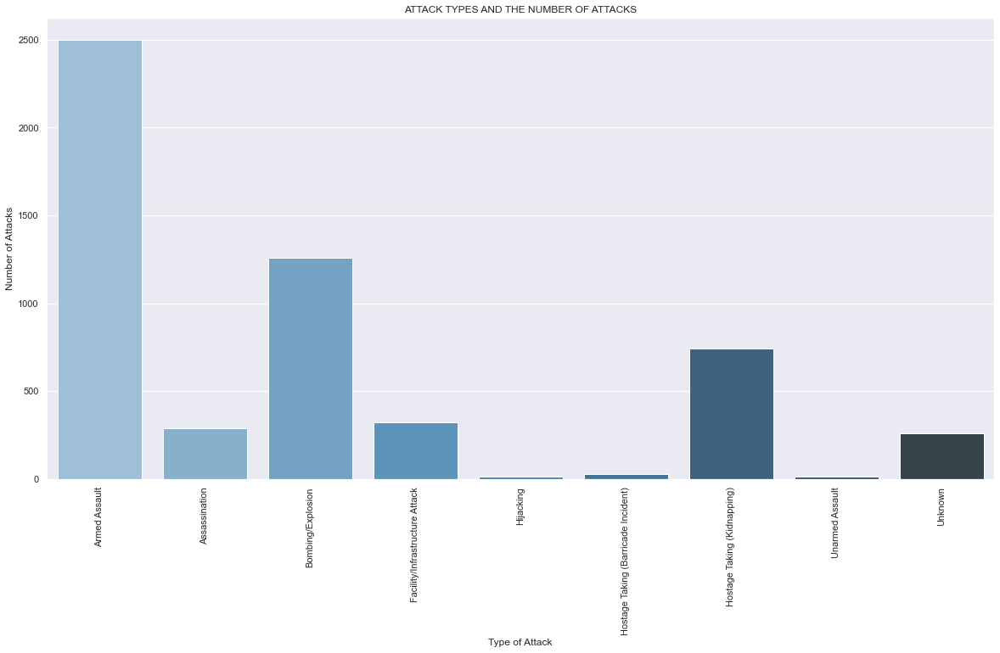

In [51]:
plt.subplots(figsize=(20,10))
sns.barplot(df_attacktype_killed['AttackType'],df_attacktype_killed['Total_attacks'],palette='Blues_d')
plt.title('ATTACK TYPES AND THE NUMBER OF ATTACKS')
plt.xlabel('Type of Attack')
plt.ylabel('Number of Attacks')
plt.xticks(rotation= 90)
plt.show()

#### The Bar plot above and below shows that the most attacks were in the form of _Armed Assault, Bombing/Explosion, and Hostage Taking(Kidnapping)_ and the most deaths were as a result of this type of attack.

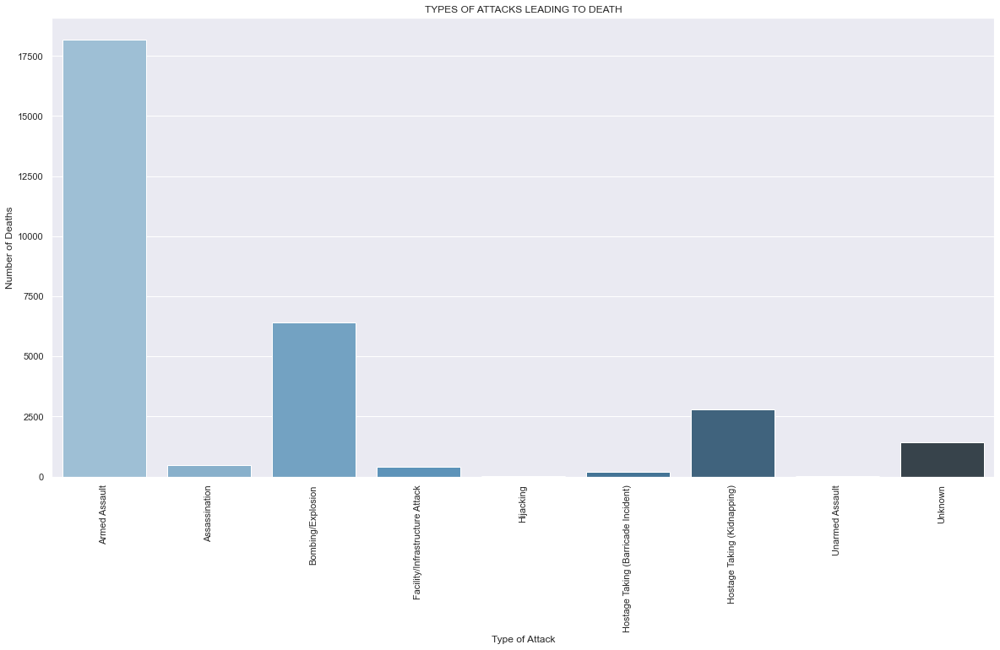

In [52]:
plt.subplots(figsize=(20,10))
sns.barplot(df_attacktype_killed['AttackType'],df_attacktype_killed['Total_killed'],palette='Blues_d')
plt.title('TYPES OF ATTACKS LEADING TO DEATH')
plt.xlabel('Type of Attack')
plt.ylabel('Number of Deaths')
plt.xticks(rotation= 90)
plt.show()

### What type/class of people were targeted by Terrorists ?

In [464]:
TargetType=df_nigeria["Target_type"].value_counts().to_frame().reset_index()
TargetType["Target-Type"]=TargetType["index"]
TargetType["Number of Attacks"]=TargetType["Target_type"]
TargetType=TargetType.drop(columns=["index","Target_type"])
TargetType=TargetType.set_index("Target-Type")

In [465]:
TargetType

,Number of Attacks
Target-Type,
Private Citizens & Property,2603
Military,608
Government (General),507
Police,394
Business,315
Religious Figures/Institutions,286
Educational Institution,152
Utilities,132
Unknown,125


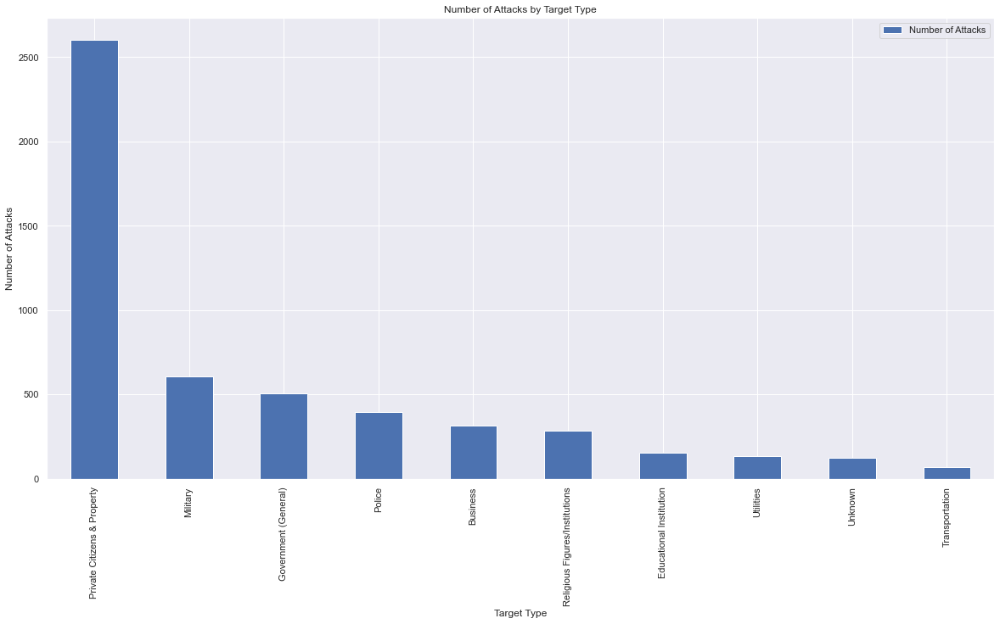

In [471]:
TargetType.head(10).plot(kind="bar",
                       xlabel="Target Type",
                       ylabel="Number of Attacks",
                       title="Number of Attacks by Target Type",
                       figsize=(20,10)
);

###### The Bar plot and Data rame above shows that :
- Majority of the Victims of Terrorist attacks are Private citizens and their properties, Government officials and security officials(Military and police).
- The security officials had either be attacked explicitly, or suffered terrorism as well, as a consequence of responding to terrorists attacks on the other Target categories. 

### What weapons were used for carrying out Terrorism?

In [468]:
Weapon_type=df_nigeria["Weapon_type"].value_counts().to_frame().reset_index()
Weapon_type["Weapons_used"]=Weapon_type["index"]
Weapon_type["Number of Attacks"]=Weapon_type["Weapon_type"]
Weapon_type=Weapon_type.drop(columns=["index","Weapon_type"])
Weapon_type=Weapon_type.set_index("Weapons_used")

In [469]:
Weapon_type

,Number of Attacks
Weapons_used,
Firearms,3038
Explosives,1534
Unknown,433
Incendiary,302
Melee,110
Sabotage Equipment,5
Chemical,3


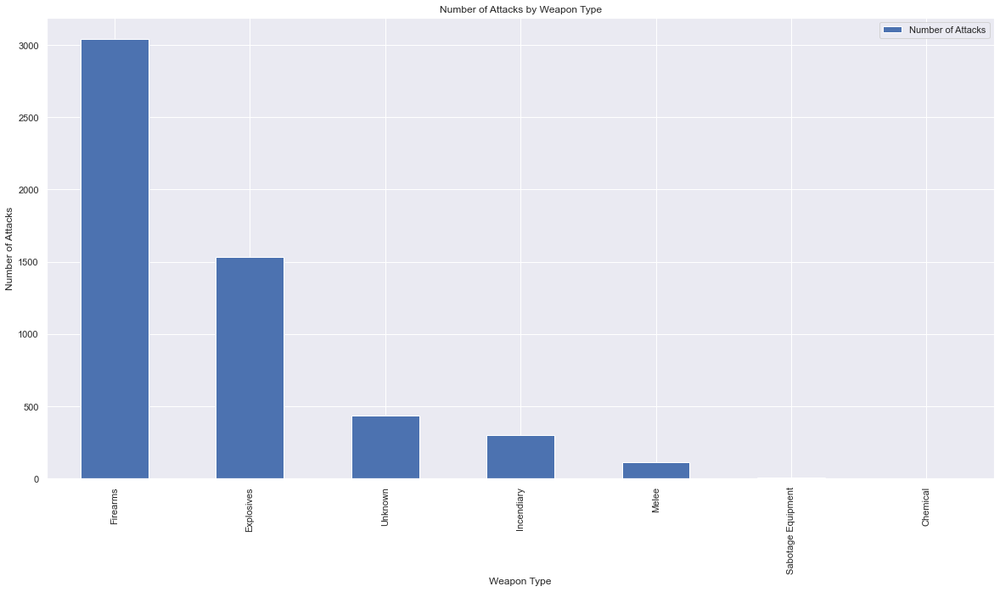

In [472]:
Weapon_type.plot(kind="bar",
                       xlabel="Weapon Type",
                       ylabel="Number of Attacks",
                       title="Number of Attacks by Weapon Type",
                       figsize=(20,10)
);

- ### Firearms, and Explosives were the most used weapons in carrying Out Terrorism

### How successful were the terrorist attacks in Nigeria ?

In [609]:
df_success = df_nigeria.groupby(['success']).agg(Total_attacks=('Killed', 'count'),Total_killed=('Killed', 'sum'),Total_wound=('Wounded', 'sum')).sort_values(by="Total_attacks", ascending=False).reset_index()
df_success[["Total_killed","Total_wound"]]=df_success[["Total_killed","Total_wound"]].astype(int)
df_success

,success,Total_attacks,Total_killed,Total_wound
0,1,4961,29237,16764
1,0,464,704,362


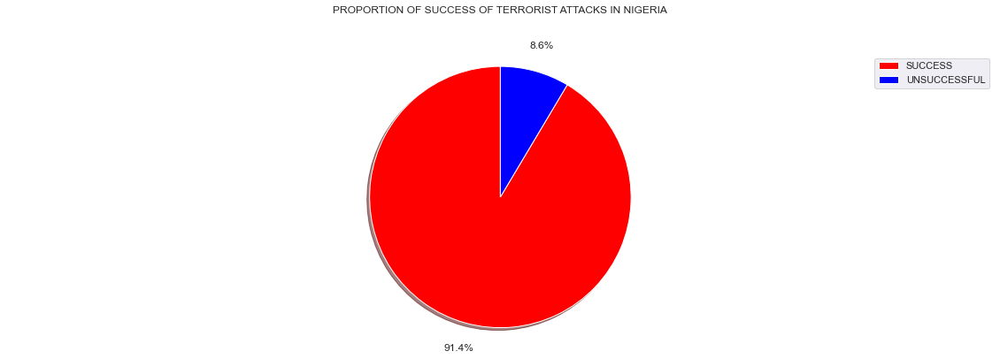

In [615]:
labels=df_success["success"].replace(1,"SUCCESS").replace(0, "UNSUCCESSFUL")
propor=df_success["Total_attacks"]
colors=["red","blue"]
plt.figure(figsize=(20, 6))
plt.pie(propor, labels=None, colors=colors,
        autopct='%1.1f%%',pctdistance=1.2, startangle=90,shadow=True)
plt.title("PROPORTION OF SUCCESS OF TERRORIST ATTACKS IN NIGERIA", y=1.12)
plt.axis("equal")
plt.legend(labels)
plt.show()

- The pie chart above shows that 91.4% of Terrorists attacks in Nigeria were Successful, while just 8.6% of attempts at terrorism were futile.
- The Data frame above shows that despite the unsuccessful attacks of terrorism, casualties were still Recorded.

## MACHINE LEARNING PREDICTION

Goals : 
- Predict if an attack would be successful or not using Random Forest and Gradient Boosting Classifier.
- Determine the best Performing Model, and save model as a file.

**Note :**
Success of a terrorist strike is defined according to the tangible effects of the attack.
Success is not judged in terms of the larger goals of the perpetrators. For example, a bomb that exploded in a building would be counted as a success even if it did not succeed in bringing the building down or inducing government repression.
The definition of a successful attack depends on the type of attack. Essentially, the key question is whether or not the attack type took place. If a case has multiple attack types, it is successful if any of the attack types are successful, with the exception of assassinations, which are only successful if the intended target is killed.

#### We would start by introducing two new features, _"kill_bool" and "wound_bool"_ into our Dataset
- The Feature "Killed" would be sustituted by a variable called "kill_bool", that gives 0 if there were not peope killed and 1 if there were people killed.
- The Feature "Wounded" would be sustituted by a variable called "wound_bool", that gives 0 if there were not peope wounded and 1 if there were people wounded.

In [275]:
df_suc_pred=df_nigeria.copy()
df_suc_pred['Kill_bool'] = df_nigeria['Killed'].apply(lambda x: 1 if x > 0 else 0)
df_suc_pred['wound_bool'] = df_nigeria['Wounded'].apply(lambda x: 1 if x > 0 else 0)

df_suc_pred.head()

,Year,Month,Day,Country,state,Region,city,latitude,longitude,AttackType,...,suicide,Target,Summary,Group,Target_type,Weapon_type,Motive,success,Kill_bool,wound_bool
3593,1976,2,13,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.452331,3.419044,Assassination,...,0,4th Head of State: General Murtala Ramat Mohammed,02/13/1976: Assailants attacked General Murtal...,Coup plotters,Government (General),Firearms,NaN,1,1,1
10025,1980,1,17,Nigeria,Kaduna,Sub-Saharan Africa,Kaduna,10.530204,7.437338,Unknown,...,0,Consulate,NaN,Zimbabwe Patriotic Front,Government (Diplomatic),Unknown,NaN,1,1,1
20219,1983,11,11,Nigeria,Unknown,Sub-Saharan Africa,Unknown,NaN,NaN,Assassination,...,0,"Senator Girgiri Lawan, Senator of ruling Natio...",NaN,Unknown,Government (General),Unknown,NaN,0,0,1
20347,1983,11,27,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.618911,3.305532,Assassination,...,0,"Chief Joe Nkpang, Assistant general Manager",NaN,Gang,Government (General),Unknown,NaN,1,1,0
20359,1983,11,29,Nigeria,Lagos,Sub-Saharan Africa,Lagos,6.455641,3.429865,Assassination,...,0,"Chief Edwin Ume-Ezeoke, former speaker",NaN,Unknown,Government (General),Firearms,NaN,0,0,1


In [276]:
df_suc_pred.columns

Index(['Year', 'Month', 'Day', 'Country', 'state', 'Region', 'city',
       'latitude', 'longitude', 'AttackType', 'Killed', 'Wounded', 'suicide',
       'Target', 'Summary', 'Group', 'Target_type', 'Weapon_type', 'Motive',
       'success', 'Kill_bool', 'wound_bool'],
      dtype='object')

#### Define a new Dataframe containing only the features that would be used in building a model.

In [277]:
df_suc_pred=df_suc_pred[["Month","Day","state","city","latitude","longitude","AttackType","Target_type","Weapon_type","Kill_bool","wound_bool","suicide","success"]]
df_suc_pred=df_suc_pred.dropna()
df_suc_pred.head()

,Month,Day,state,city,latitude,longitude,AttackType,Target_type,Weapon_type,Kill_bool,wound_bool,suicide,success
3593,2,13,Lagos,Lagos,6.452331,3.419044,Assassination,Government (General),Firearms,1,1,0,1
10025,1,17,Kaduna,Kaduna,10.530204,7.437338,Unknown,Government (Diplomatic),Unknown,1,1,0,1
20347,11,27,Lagos,Lagos,6.618911,3.305532,Assassination,Government (General),Unknown,1,0,0,1
20359,11,29,Lagos,Lagos,6.455641,3.429865,Assassination,Government (General),Firearms,0,1,0,0
33216,1,23,Lagos,Lagos,6.618911,3.305532,Assassination,Government (Diplomatic),Firearms,1,0,0,1


##### Spliting of Data into Features(Used for training and making predictions) and Target(The column we hope to predict)

In [278]:
X = df_suc_pred.drop(["success"], axis = 1, inplace = False)
X.head(8)

,Month,Day,state,city,latitude,longitude,AttackType,Target_type,Weapon_type,Kill_bool,wound_bool,suicide
3593,2,13,Lagos,Lagos,6.452331,3.419044,Assassination,Government (General),Firearms,1,1,0
10025,1,17,Kaduna,Kaduna,10.530204,7.437338,Unknown,Government (Diplomatic),Unknown,1,1,0
20347,11,27,Lagos,Lagos,6.618911,3.305532,Assassination,Government (General),Unknown,1,0,0
20359,11,29,Lagos,Lagos,6.455641,3.429865,Assassination,Government (General),Firearms,0,1,0
33216,1,23,Lagos,Lagos,6.618911,3.305532,Assassination,Government (Diplomatic),Firearms,1,0,0
33773,3,13,Lagos,Lagos,6.618911,3.305532,Assassination,Educational Institution,Firearms,1,0,0
45918,3,28,Katsina,Unknown,12.323997,7.520477,Facility/Infrastructure Attack,Journalists & Media,Incendiary,0,0,0
47907,8,30,Zamfara,Gusau City,12.169841,6.674302,Facility/Infrastructure Attack,Government (General),Incendiary,1,0,0


In [279]:
Y = df_suc_pred['success']
Y.head(8)

3593     1
10025    1
20347    1
20359    0
33216    1
33773    1
45918    1
47907    1
Name: success, dtype: int64

##### Importing Required Libraries

In [339]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import ConfusionMatrixDisplay,classification_report,confusion_matrix,accuracy_score
from sklearn.model_selection import GridSearchCV, cross_val_score,train_test_split
from sklearn.pipeline import make_pipeline

##### Using a heat map to visualize the relationship between the features in our data and how much they correlate with the target feature(Y)

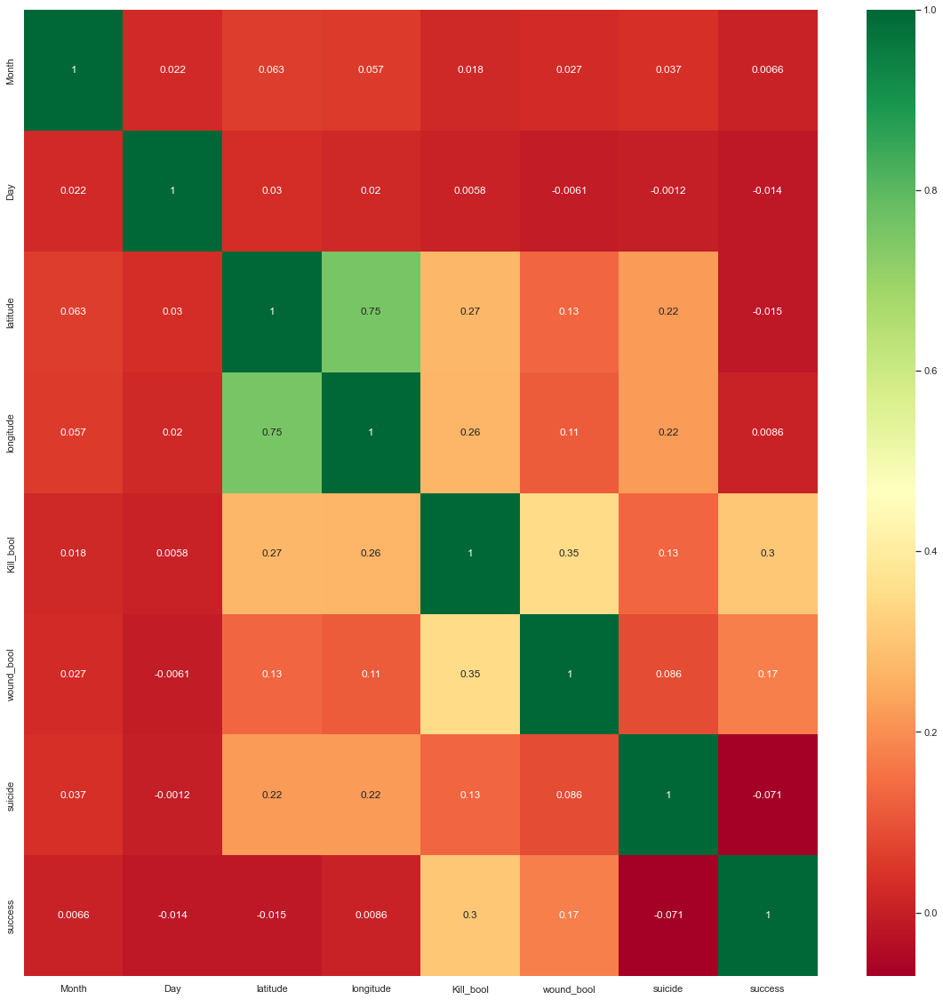

In [281]:
data = df_suc_pred
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

#### Spliting of  data frame into training and test sets.
- Training set(X) for building our Model
- Test set(Y) for Validating Our Model

In [282]:
X_train,X_test, y_train, y_test=train_test_split(X,Y,test_size=0.2, random_state=42)

In [283]:
over_sampler=RandomOverSampler(random_state=42)
X_train_Over,Y_train_over= over_sampler.fit_resample(X_train,y_train)

##### Next, we would dictate a baseline to gauge our Model's Performance. A good model MUST beat the baseline

In [284]:
acc_baseline=y_train.value_counts(normalize=True).max()
acc_baseline

0.9132961413296141

##### As seen above, the accuracy of the baseline(The max value count in our target feature) is about 91.3%. Our Model must have an accuracy greater than that of the baseline.

### RANDOM FOREST CLASSIFICATION

##### We would now create a pipeline consisting of OneHotEncoder(For Categorical Features), and RandomForest(The model we would used in training our data)

In [285]:
clf=make_pipeline(OneHotEncoder(handle_unknown="ignore"),
                  RandomForestClassifier(random_state=42)
)
print(clf)

Pipeline(steps=[('onehotencoder', OneHotEncoder(handle_unknown='ignore')),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=42))])


In [348]:
cv_acc_scores=cross_val_score(clf, X_train_Over, Y_train_over, cv=5, n_jobs=-1)
print(cv_acc_scores)

[0.99618321 0.98854962 0.99045802 0.99236155 0.98408657]


##### Defining the parameters we would use for our model

In [349]:
params={
    "randomforestclassifier__n_estimators" : range(25,100,25),
    "randomforestclassifier__max_depth" : range(10,50,10)
}
params

{'randomforestclassifier__n_estimators': range(25, 100, 25),
 'randomforestclassifier__max_depth': range(10, 50, 10)}

##### We would now use GridSearch for tune our hyperparameters for optimum model performance

In [363]:
model=GridSearchCV(
    clf, param_grid=params,
    cv=5, n_jobs=-1, verbose=1
)
model

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('onehotencoder',
                                        OneHotEncoder(handle_unknown='ignore')),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__max_depth': range(10, 50, 10),
                         'randomforestclassifier__n_estimators': range(25, 100, 25)},
             verbose=1)

##### Fit Model into our training data to make predictions.

In [390]:
model.fit(X_train,y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('onehotencoder',
                                        OneHotEncoder(handle_unknown='ignore')),
                                       ('randomforestclassifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid={'randomforestclassifier__max_depth': range(10, 50, 10),
                         'randomforestclassifier__n_estimators': range(25, 100, 25)},
             verbose=1)

In [391]:
cv_results=pd.DataFrame(model.cv_results_)
cv_results.head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_randomforestclassifier__max_depth,param_randomforestclassifier__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.196178,0.030959,0.022165,9.841506e-03,10,25,"{'randomforestclassifier__max_depth': 10, 'ran...",0.912892,0.912892,0.913953,0.913953,0.912791,0.913296,0.000538,9
1,0.342567,0.034622,0.018746,6.248426e-03,10,50,"{'randomforestclassifier__max_depth': 10, 'ran...",0.912892,0.912892,0.913953,0.913953,0.912791,0.913296,0.000538,9
2,0.540575,0.072390,0.034367,6.248856e-03,10,75,"{'randomforestclassifier__max_depth': 10, 'ran...",0.912892,0.912892,0.913953,0.913953,0.912791,0.913296,0.000538,9
3,0.448710,0.062601,0.024868,1.308846e-02,20,25,"{'randomforestclassifier__max_depth': 20, 'ran...",0.912892,0.912892,0.915116,0.920930,0.912791,0.914924,0.003128,7
4,0.883276,0.112907,0.042773,1.473379e-02,20,50,"{'randomforestclassifier__max_depth': 20, 'ran...",0.912892,0.912892,0.913953,0.915116,0.912791,0.913529,0.000901,8
5,1.283856,0.135082,0.031243,2.431402e-07,20,75,"{'randomforestclassifier__max_depth': 20, 'ran...",0.912892,0.912892,0.913953,0.913953,0.912791,0.913296,0.000538,9
6,0.785084,0.052397,0.022539,7.217258e-03,30,25,"{'randomforestclassifier__max_depth': 30, 'ran...",0.918699,0.912892,0.923256,0.919767,0.916279,0.918179,0.003468,5
7,1.628987,0.176902,0.040616,1.874531e-02,30,50,"{'randomforestclassifier__max_depth': 30, 'ran...",0.916376,0.914053,0.924419,0.917442,0.922093,0.918877,0.003811,4
8,2.226064,0.212761,0.046114,1.717816e-02,30,75,"{'randomforestclassifier__max_depth': 30, 'ran...",0.916376,0.914053,0.920930,0.916279,0.919767,0.917481,0.002512,6
9,1.270226,0.135722,0.021870,7.652339e-03,40,25,"{'randomforestclassifier__max_depth': 40, 'ran...",0.921022,0.914053,0.930233,0.925581,0.918605,0.921899,0.005589,1


In [392]:
mask = cv_results["param_randomforestclassifier__max_depth"]==10

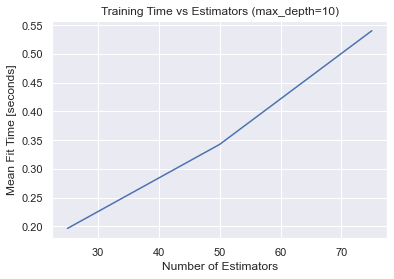

In [561]:
plt.plot(
    cv_results[mask]["param_randomforestclassifier__n_estimators"],
    cv_results[mask]["mean_fit_time"]
);
plt.xlabel("Number of Estimators")
plt.ylabel("Mean Fit Time [seconds]")
plt.title("Training Time vs Estimators (max_depth=10)");

##### What are the best model's Parameters ?

In [394]:
model.best_params_

{'randomforestclassifier__max_depth': 40,
 'randomforestclassifier__n_estimators': 25}

##### What is the best score of our model?

In [395]:
model.best_score_

0.9218988196526483

##### What is the best estimator of our model ?

In [396]:
model.best_estimator_

Pipeline(steps=[('onehotencoder', OneHotEncoder(handle_unknown='ignore')),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=40, n_estimators=25,
                                        random_state=42))])

##### What are the accuracy scores of our model?

In [397]:
acc_train=model.score(X_train,y_train)
acc_test=model.score(X_test,y_test)
print("Accuracy of training set :", acc_train)
print("Accuracy of test set :", acc_test)

Accuracy of training set : 0.9583914458391446
Accuracy of test set : 0.9284386617100372


#### A model is judged based on its performance on data it has not seen. Hence, Th accuracy score of our test set would be our Evaluation Metric. The accuracy score is 0.9284, and this just slightly beat our baseline model with an accuracy score of 0.9133.

In [398]:
y_test.value_counts()

1    988
0     88
Name: success, dtype: int64

##### Next, we would use a confusion matrix display to show how our model performed in predicting the success or failure of a terrorist attack.

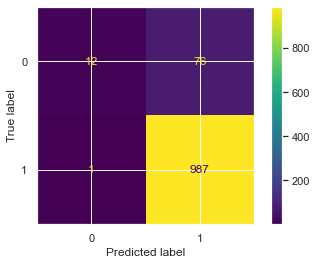

In [399]:
ConfusionMatrixDisplay.from_estimator(model,X_test,y_test)

##### The Confusion Matrix Display reveals the following about our Model :
- Our Model performed very well in predicting The success of an attack, which is very important as accurate predictions of Success would ensure meaures are taken immediately to counter the action of an attack.
- Our Model did not do very well in predicting if an attack would be unsuccesful

In [454]:
class_report2=classification_report(y_test,model.predict(X_test))
print(class_report2)

              precision    recall  f1-score   support

           0       0.92      0.14      0.24        88
           1       0.93      1.00      0.96       988

    accuracy                           0.93      1076
   macro avg       0.93      0.57      0.60      1076
weighted avg       0.93      0.93      0.90      1076



##### The Classification Report summarises the performance of our Model.

#### Next, Let us take a look at the importance of the features of our data towards the performance of our model.

In [388]:
import numpy as np
features=X_train.columns
importances=model.best_estimator_.named_steps["randomforestclassifier"].feature_importances_
importances=np.sort(importances)
importances[7275:]

array([0.01617979, 0.01635437, 0.01656223, 0.01941939, 0.02074401,
       0.02157836, 0.02484222, 0.03029551, 0.03236335, 0.04130105,
       0.07700024, 0.0791269 ])

<AxesSubplot:>

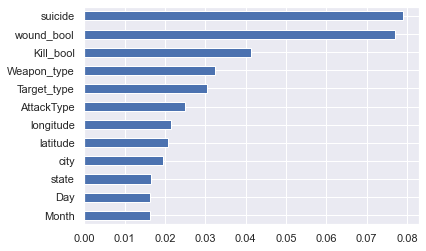

In [389]:
feat_imp=pd.Series(importances[7275:],index=features).sort_values()
feat_imp.plot(kind="barh")

##### The Bar Chart above shows the Importance of our features in order using a bar chart.

##### Time to Save our Model for Future Use.

In [699]:
import pickle
with open("random-forest-model", "wb") as f :
    pickle.dump(model, f)
print("Model Saved")

Model Saved


### GRADIENT BOOSTING CLASSIFIER

In [400]:
from sklearn.ensemble import GradientBoostingClassifier

#### We would go through the steps we went through using Random Forest.

In [430]:
clg=make_pipeline(
    OneHotEncoder(handle_unknown="ignore"),
    GradientBoostingClassifier()
)

In [431]:
param={
    "gradientboostingclassifier__n_estimators": range(20,31,5),
    "gradientboostingclassifier__max_depth" : range(2,5)
}
param

{'gradientboostingclassifier__n_estimators': range(20, 31, 5),
 'gradientboostingclassifier__max_depth': range(2, 5)}

In [445]:
model2=GridSearchCV(
    clg, param_grid=param,
    cv=5, n_jobs=-1, verbose=1
)
model2.fit(X_train,y_train)

Fitting 5 folds for each of 9 candidates, totalling 45 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('onehotencoder',
                                        OneHotEncoder(handle_unknown='ignore')),
                                       ('gradientboostingclassifier',
                                        GradientBoostingClassifier())]),
             n_jobs=-1,
             param_grid={'gradientboostingclassifier__max_depth': range(2, 5),
                         'gradientboostingclassifier__n_estimators': range(20, 31, 5)},
             verbose=1)

In [446]:
results=pd.DataFrame(model2.cv_results_)
results.sort_values("rank_test_score").head(10)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_gradientboostingclassifier__max_depth,param_gradientboostingclassifier__n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
7,2.602351,0.089996,0.028218,0.002584,4,25,"{'gradientboostingclassifier__max_depth': 4, '...",0.943089,0.937282,0.945349,0.941860,0.940698,0.941656,0.002675,1
8,2.841893,0.100145,0.027519,0.005091,4,30,"{'gradientboostingclassifier__max_depth': 4, '...",0.943089,0.936121,0.945349,0.941860,0.939535,0.941191,0.003156,2
6,2.129274,0.034691,0.029813,0.005452,4,20,"{'gradientboostingclassifier__max_depth': 4, '...",0.941928,0.937282,0.944186,0.938372,0.940698,0.940493,0.002472,3
5,2.210034,0.027775,0.025666,0.005613,3,30,"{'gradientboostingclassifier__max_depth': 3, '...",0.934959,0.933798,0.941860,0.930233,0.940698,0.936310,0.004362,4
4,1.904926,0.025225,0.025756,0.002205,3,25,"{'gradientboostingclassifier__max_depth': 3, '...",0.934959,0.933798,0.939535,0.930233,0.937209,0.935147,0.003147,5
3,1.583318,0.091569,0.026928,0.002401,3,20,"{'gradientboostingclassifier__max_depth': 3, '...",0.934959,0.934959,0.936047,0.930233,0.937209,0.934681,0.002375,6
2,1.491990,0.050704,0.025464,0.002150,2,30,"{'gradientboostingclassifier__max_depth': 2, '...",0.933798,0.933798,0.937209,0.930233,0.937209,0.934449,0.002602,7
0,1.018057,0.024562,0.031474,0.008788,2,20,"{'gradientboostingclassifier__max_depth': 2, '...",0.933798,0.932636,0.936047,0.930233,0.937209,0.933985,0.002473,8
1,1.280946,0.029655,0.027974,0.005418,2,25,"{'gradientboostingclassifier__max_depth': 2, '...",0.933798,0.932636,0.936047,0.929070,0.937209,0.933752,0.002842,9


In [447]:
model2.best_params_

{'gradientboostingclassifier__max_depth': 4,
 'gradientboostingclassifier__n_estimators': 25}

##### What are the accuracy scores of our model on both train and test sets ?

In [448]:
acc_train=model2.score(X_train,y_train)
acc_test=model2.score(X_test,y_test)
print("Accuracy of training set :", acc_train)
print("Accuracy of test set :", acc_test)

Accuracy of training set : 0.9460715946071595
Accuracy of test set : 0.9516728624535316


#### The accuracy score of an our model is 0.9517. This greatly beats our baseline of 0.9133, and by this indication, performed better than the previous Model using Random Forest with 0.9284. However, in this case where we are much greatly concerned with predicting if an attack would be successful,a confusion matrix would be the final step in evaluating our model 

In [449]:
y_test.value_counts()

1    988
0     88
Name: success, dtype: int64

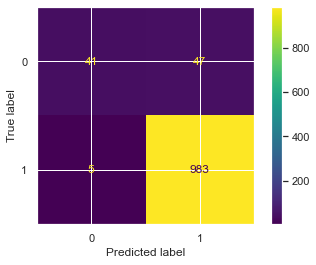

In [450]:
ConfusionMatrixDisplay.from_estimator(model2,X_test,y_test)

##### The confusion matrix above shows that :
- While our model has greatly improved in accuracy by doing better in predicting an unsuccessful attack, it has slighly underperformed in predicting a successful attack, which is very important.
- Accuracy score is not only the important metric in evaluating our model. In this case, a model with a better recall score(Random Forest in this case) is favored, as taking immediate measures to counter the the action of a potential successful terrorist attack is paramaount.

##### The classification report below summarises our model's performance.

In [455]:
class_report=classification_report(y_test,model2.predict(X_test))
print(class_report)

              precision    recall  f1-score   support

           0       0.89      0.47      0.61        88
           1       0.95      0.99      0.97       988

    accuracy                           0.95      1076
   macro avg       0.92      0.73      0.79      1076
weighted avg       0.95      0.95      0.94      1076



#### Now, Let us take a look at the importance of the features of our data towards the performance of our Gradient Boosting Model.

In [617]:
features=X_train.columns
importances1=model2.best_estimator_.named_steps["gradientboostingclassifier"].feature_importances_
importances1=np.sort(importances)
importances1[7275:]

array([0.01617979, 0.01635437, 0.01656223, 0.01941939, 0.02074401,
       0.02157836, 0.02484222, 0.03029551, 0.03236335, 0.04130105,
       0.07700024, 0.0791269 ])

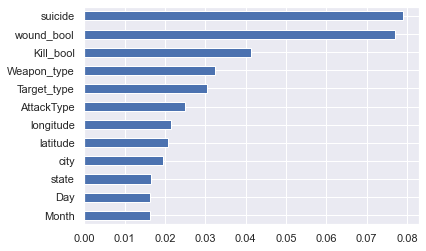

In [619]:
feat_imp2=pd.Series(importances1[7275:],index=features).sort_values()
feat_imp2.plot(kind="barh");

##### The Bar Chart above shows the Importance of our features in order using a bar chart.

Next, we save our model as a file for future use.

In [698]:
import pickle
with open("gradient-boosting-model", "wb") as f :
    pickle.dump(model, f)
print("Model Saved")

Model Saved


**CONCLUSION :**

**From the results of all analysis done above, the following conclusions can be drawn:**

Exploratory Analysis of the Data
- Terrorism was on the low in the 90s and increased significantly from 2010.
- Nigeria Experience the highest level of terrorim in 2014. There was also a very significant account of terrorism in 2020 despite the COVID lockdown.
- The Northeast Geopolitical zone was the most terrorized zone in the northern Region, and in Nigeria at large.
- South South Geopolitical zone is the most terrorized zone in the southern Region of Nigeria.
- Most Casualties, including death were recorded in the North Eastern zone.
- Borno State was by far the most terrorised state in Nigeria across the years, and also accounted for the highest number of casualties(Including deaths).
- Boko Haram is the largest terrorist group in nigeria, in terms of Terrorist activities.
- Most Terrorist attacks were in the form of Armed Assault, Bombing/Explosion, and Hostage Taking(Kidnapping). The highest number of casualties were also were also as a result of this kind of attacks.
- Private Citizens and Property, Military personnels, and Government Officials, were the most victims of terrorist attacks.
- Firearms and Explosives were the most used weapons in carrying out terrorist attacks.
- Most Terrorist attacks in Nigeria were Successful. Successful attacks account for about 91% of all attacks. This is a disturbing and alarming success rate. 

Machine Learning Insights
- Gradient Boosting Classifier was the best performing model, having higher accuracy score than both the baseline, and Random Forest Classifier.
- Random Forest Classifier, though having lesser accuracy score than Gradient Boosting Classifier, was best in predictintg successful outcome, hence having a slightly higher recall score.
- The choice of what model to used depends on what we hope to achieve. If hoping to more accurately predict the success of potential terrorist attacks, then the choice should be Random Forest. However, if the aim is to get a generally performing model, good at predicting both outcome(together) bettet, then the choice should be the Gradient Boosting Model.

###### Finally, an interactive dashboard would be created using plotly dash, that users can interact with. The dash app would require the user to choose from a drop down of years, and in turn return the some key terrorism information about that year, ranging from The number of attacks in the choosen year, to the success rate of terrorism.

- Import Required libraries

In [830]:
import dash
from dash import html
from dash import dcc
from dash.dependencies import Input, Output, State
import plotly.express as px
from dash import no_update
import json

# Create a dash application
app = dash.Dash(__name__)

# Clear the layout and do not display exception till callback gets executed
app.config.suppress_callback_exceptions = True

# Read the airline data
dash_data =  df_nigeria1.copy()

- The code below would create the dash app layout. Please go through the comments(#%) for understanding the function of the codes.

In [831]:
year_list = [i for i in (dash_data['Year'].unique())]

In [832]:
app.layout= html.Div(children=[html.H1(
    'TERRORISM IN NIGERIA INFORMATION DASHBOARD',
    style={'textAlign':'center','color':'#503D36','font-size': 24}),
                               html.Div([
                                    # Add a division
                                    html.Div([
                                       # Create a division for adding dropdown helper text for choosing year
                                        html.Div(
                                            [
                                            html.H2('Choose Year:', style={'margin-right': '2em'})
                                            ]
                                        ),
                                        dcc.Dropdown(id='input-year', 
                                                     # Update dropdown values using list comphrehension
                                                     options=[{'label': i, 'value': i} for i in year_list],
                                                     placeholder="Select a year",
                                                     style={'width':'80%', 'padding':'3px', 'font-size': '20px', 'text-align-last' : 'center'}),
                                            # Place them next to each other using the division style
                                            ], style={'display': 'flex'}),  
                                          ]),
                               # Add Computed graphs
                               # Add empty divisions providing an id that will be updated during callback
                               html.Div([
                                   html.Div(dcc.Graph(id='plot1')),
                                   html.Div(dcc.Graph(id='plot2'))
                               ], style={'display': 'flex'}),
                               
                               html.Div([
                                   html.Div(dcc.Graph(id='plot3')),
                                   html.Div(dcc.Graph(id='plot4'))
                               ], style={'display': 'flex'}),
                                
                                # Add another division with two empty divisions inside.                                  
                               html.Div([
                                   html.Div(dcc.Graph(id='plot5')),
                                   html.Div(dcc.Graph(id='plot6'))
                               ], style={'display': 'flex'}),
                               html.Div([
                                   html.Div(dcc.Graph(id='plot7')),
                                   html.Div(dcc.Graph(id='plot8'))
                               ], style={'display': 'flex'}),
                               html.Div([
                                   html.Div(dcc.Graph(id='plot9')),
                                   html.Div(dcc.Graph(id='plot10'))
                               ], style={'display': 'flex'})
                              ])

- Use the callback function to add the resulting graphs based on certain conditions to the interactive dash app.

In [833]:
@app.callback(
    [Output(component_id='plot1', component_property='figure'),
     Output(component_id='plot2', component_property='figure'),
     Output(component_id='plot3', component_property='figure'),
     Output(component_id='plot4', component_property='figure'),
     Output(component_id='plot5', component_property='figure'),
     Output(component_id='plot6', component_property='figure'),
     Output(component_id='plot7', component_property='figure'),
     Output(component_id='plot8', component_property='figure'),
     Output(component_id='plot9', component_property='figure'),
     Output(component_id='plot10', component_property='figure')],
    [Input(component_id='input-year', component_property='value')])
# Add computation to callback function and return graph
def get_graph(entered_year):
    # Select data
    dash_data=df_nigeria1[df_nigeria1["Year"]==int(entered_year)]
    # Number of People attacks in each state per year
    bar_data1 = dash_data.groupby(["state"])["Year"].count().sort_values(ascending=False).reset_index()
    bar_fig1 = px.bar(bar_data1, x='state', y='Year', color='state', title='Total Yearly Number of attacks')
    bar_fig1.update_layout(xaxis_title="State",yaxis_title="Number of Attacks")
    
    # Number of people Killed per year
    bar_data2 = dash_data.groupby(["state"])["Killed"].sum().sort_values(ascending=False).reset_index()
    bar_fig2 = px.bar(bar_data2, x='state', y='Killed', color='state', title='Total Yearly Number of deaths')
    bar_fig2.update_layout(xaxis_title="State",yaxis_title="Number of Deaths")
            
    # Success Rate of Attacks
    pie_data = dash_data.groupby(['success']).agg(Total_attacks=('Killed', 'count'),Total_killed=('Killed', 'sum'),Total_wound=('Wounded', 'sum')).sort_values(by="Total_attacks", ascending=False).reset_index()
    pie_data[["Total_killed","Total_wound"]]=pie_data[["Total_killed","Total_wound"]].astype(int)
    labels=pie_data["success"].replace(1,"SUCCESS").replace(0, "UNSUCCESSFUL")
    pie_fig = px.pie(pie_data, values='Total_attacks', names=labels, title='SUCCESS RATE(%) OF TERRORIST ATTACKS')
    
    # Percentage of attacks by zone
    pie_data1 = dash_data.groupby(['zone']).agg(Total_attacks=('Killed', 'count'),Total_killed=('Killed', 'sum'),Total_wound=('Wounded', 'sum')).sort_values(by="Total_attacks", ascending=False).reset_index()
    pie_data1[["Total_killed","Total_wound"]]=pie_data1[["Total_killed","Total_wound"]].astype(int)
    label1=dash_data["zone"].unique()
    pie_fig1 = px.pie(pie_data1, values='Total_attacks', names=label1, title='% OF ATTACKS BY GEOPOLITICAL ZONE')
    
    pie_data2 = dash_data.groupby(['zone']).agg(Total_attacks=('Killed', 'count'),Total_killed=('Killed', 'sum'),Total_wound=('Wounded', 'sum')).sort_values(by="Total_attacks", ascending=False).reset_index()
    pie_data2[["Total_killed","Total_wound"]]=pie_data2[["Total_killed","Total_wound"]].astype(int)
    label2=dash_data["zone"].unique()
    pie_fig2 = px.pie(pie_data2, values='Total_killed', names=label2, title='% OF DEATHS BY GEOPOLITICAL ZONE')
    
    #Terrorist Groups
    bar_data3 = dash_data.groupby(["Group"])["Year"].count().sort_values(ascending=False).reset_index()
    bar_fig3 = px.bar(bar_data3, x='Group', y='Year', color='Group', title='Terrorist Group attacks')
    bar_fig3.update_layout(xaxis_title="Terrorist Group",yaxis_title="Number of Attacks")
    
    #Most Targetted type of victims
    bar_data4 = dash_data.groupby(['Target_type'])['Year'].count().sort_values(ascending=False).reset_index()
    bar_fig4 = px.bar(bar_data4, x='Target_type', y='Year', color='Target_type', title='Most Targetted Class of Victims')
    bar_fig4.update_layout(xaxis_title="Targeted Class",yaxis_title="Number of Attacks")
    
    #Most used type of weapon
    bar_data5= dash_data.groupby(['Weapon_type'])['Year'].count().sort_values(ascending=False).reset_index()
    bar_fig5 = px.bar(bar_data5, x='Weapon_type', y='Year', color='Weapon_type', title='Most used Weapons for Terrorism')
    bar_fig5.update_layout(xaxis_title="Weapon Type",yaxis_title="Number of Attacks")
    
    #Most common type of attack
    bar_data6=dash_data.groupby(['AttackType'])['Year'].count().sort_values(ascending=False).reset_index()
    bar_fig6 = px.bar(bar_data6, x='AttackType', y='Year', color='AttackType', title='Methods of Terrorist Attacks')
    bar_fig6.update_layout(xaxis_title="Attack Type",yaxis_title="Number of Attacks")
    
    # distribution of attacks from each state using choropleth
    nigeria_geo=pd.DataFrame({"state":dash_data["state"].value_counts().index,"Number-of-attacks":dash_data["state"].value_counts().values})
    path=open(r"C:\Users\User\Desktop\Machine Learning Project\Boundary_states.json")
    state_geo=json.load(path)
    max_count = nigeria_geo['Number-of-attacks'].max()
    map_fig = px.choropleth_mapbox(nigeria_geo,
                               geojson=state_geo,
                               locations='state',
                               color='Number-of-attacks',
                               color_continuous_scale="YlGnBu",
                               range_color=(0, max_count),
                               featureidkey="properties.StateName",
                               mapbox_style="carto-positron",
                               opacity=0.5,
                               center = {"lat": 9.0820, "lon": 8.6753}, 
                               zoom=5)
    map_fig.update_geos(fitbounds="locations",visible=False)
    map_fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0},)
    # Return dcc.Graph component to the empty division
    return bar_fig1, bar_fig2, pie_fig1, pie_fig2, bar_fig3, bar_fig4, bar_fig5, bar_fig6,pie_fig, map_fig


- Finally, Launch the app on your local host

In [835]:
if __name__ == '__main__':
    app.run_server(debug=False, port=320)

Dash is running on http://127.0.0.1:320/

Dash is running on http://127.0.0.1:320/

Dash is running on http://127.0.0.1:320/

Dash is running on http://127.0.0.1:320/

Dash is running on http://127.0.0.1:320/

Dash is running on http://127.0.0.1:320/

Dash is running on http://127.0.0.1:320/

Dash is running on http://127.0.0.1:320/

Dash is running on http://127.0.0.1:320/

 * Serving Flask app "__main__" (lazy loading)
 * Environment: production
   Use a production WSGI server instead.
 * Debug mode: off


 * Running on http://127.0.0.1:320/ (Press CTRL+C to quit)


- Click the link on the ouput of the above code to see your dash app
- The dasboard should look like the image below

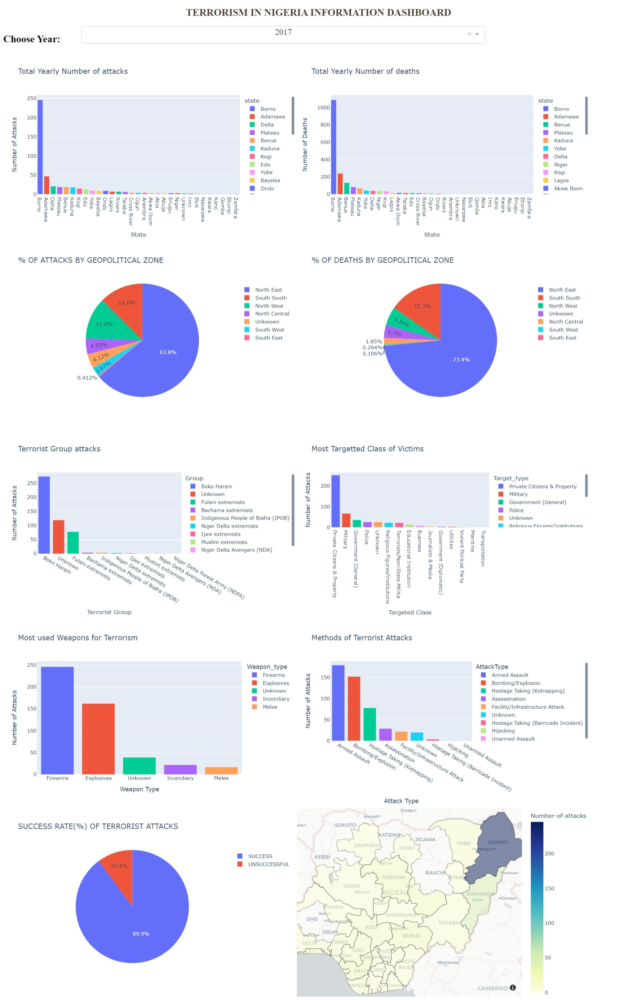

#### END OF PROJECT

### [IGEMHOKHAI SHEDRACH](https://www.linkedin.com/igemhokhai-shedrach-60982819a)